In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [3]:
df = pd.read_csv('Employee.csv')

In [4]:
df

,Education,JoiningYear,City,PaymentTier,Age,Gender,EverBenched,ExperienceInCurrentDomain,LeaveOrNot
0,Bachelors,2017,Bangalore,3,34,Male,No,0,0
1,Bachelors,2013,Pune,1,28,Female,No,3,1
2,Bachelors,2014,New Delhi,3,38,Female,No,2,0
3,Masters,2016,Bangalore,3,27,Male,No,5,1
4,Masters,2017,Pune,3,24,Male,Yes,2,1
...,...,...,...,...,...,...,...,...,...
4648,Bachelors,2013,Bangalore,3,26,Female,No,4,0
4649,Masters,2013,Pune,2,37,Male,No,2,1
4650,Masters,2018,New Delhi,3,27,Male,No,5,1
4651,Bachelors,2012,Bangalore,3,30,Male,Yes,2,0


In [12]:
pd.options.display.max_rows = None

In [13]:
df

,Education,JoiningYear,City,PaymentTier,Age,Gender,EverBenched,ExperienceInCurrentDomain,LeaveOrNot
0,Bachelors,2017,Bangalore,3,34,Male,No,0,0
1,Bachelors,2013,Pune,1,28,Female,No,3,1
2,Bachelors,2014,New Delhi,3,38,Female,No,2,0
3,Masters,2016,Bangalore,3,27,Male,No,5,1
4,Masters,2017,Pune,3,24,Male,Yes,2,1
5,Bachelors,2016,Bangalore,3,22,Male,No,0,0
6,Bachelors,2015,New Delhi,3,38,Male,No,0,0
7,Bachelors,2016,Bangalore,3,34,Female,No,2,1
8,Bachelors,2016,Pune,3,23,Male,No,1,0
9,Masters,2017,New Delhi,2,37,Male,No,2,0


In [14]:
df['JoiningYear'].unique()

array([2017, 2013, 2014, 2016, 2015, 2012, 2018], dtype=int64)

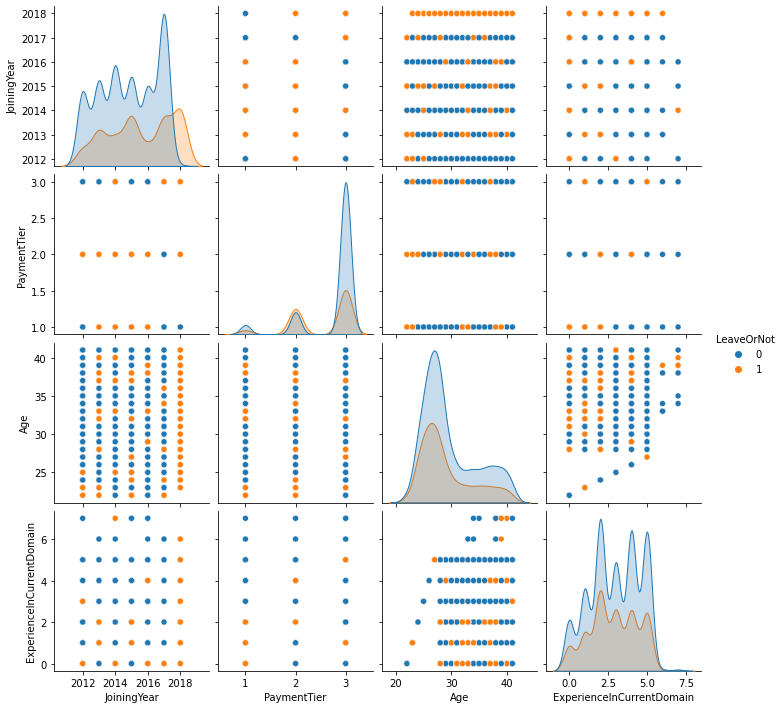

In [15]:
sns.pairplot(df,hue='LeaveOrNot')

In [21]:
from sklearn.preprocessing import LabelEncoder

In [22]:
encoder = LabelEncoder()

In [44]:
Columns = ['Education','City','Gender','EverBenched']

In [47]:
df[Columns] = df[['Education','City','Gender','EverBenched']].apply(encoder.fit_transform)

In [48]:
df

,Education,JoiningYear,City,PaymentTier,Age,Gender,EverBenched,ExperienceInCurrentDomain,LeaveOrNot
0,0,2017,0,3,34,1,0,0,0
1,0,2013,2,1,28,0,0,3,1
2,0,2014,1,3,38,0,0,2,0
3,1,2016,0,3,27,1,0,5,1
4,1,2017,2,3,24,1,1,2,1
5,0,2016,0,3,22,1,0,0,0
6,0,2015,1,3,38,1,0,0,0
7,0,2016,0,3,34,0,0,2,1
8,0,2016,2,3,23,1,0,1,0
9,1,2017,1,2,37,1,0,2,0


In [49]:
df['Current Year'] = 2021

In [52]:
df['Number Years Worked'] = df['Current Year'] - df['JoiningYear']

In [56]:
from sklearn.preprocessing import StandardScaler

In [58]:
scaler = StandardScaler()

In [59]:
columns_to_be_scaled = ['Age','Number Years Worked','ExperienceInCurrentDomain']

In [60]:
df[columns_to_be_scaled] = scaler.fit_transform(df[columns_to_be_scaled])

In [61]:
df

,Education,JoiningYear,City,PaymentTier,Age,Gender,EverBenched,ExperienceInCurrentDomain,LeaveOrNot,Current Year,Number Years Worked
0,0,2017,0,3,0.954645,1,0,-1.864901,0,2021,-1.039638
1,0,2013,2,1,-0.288732,0,0,0.060554,1,2021,1.107233
2,0,2014,1,3,1.783563,0,0,-0.581264,0,2021,0.570515
3,1,2016,0,3,-0.495961,1,0,1.344191,1,2021,-0.502921
4,1,2017,2,3,-1.117650,1,1,-0.581264,1,2021,-1.039638
5,0,2016,0,3,-1.532109,1,0,-1.864901,0,2021,-0.502921
6,0,2015,1,3,1.783563,1,0,-1.864901,0,2021,0.033797
7,0,2016,0,3,0.954645,0,0,-0.581264,1,2021,-0.502921
8,0,2016,2,3,-1.324879,1,0,-1.223083,0,2021,-0.502921
9,1,2017,1,2,1.576334,1,0,-0.581264,0,2021,-1.039638


In [63]:
df = df.drop(['JoiningYear','Current Year'],axis=1)

In [64]:
df

,Education,City,PaymentTier,Age,Gender,EverBenched,ExperienceInCurrentDomain,LeaveOrNot,Number Years Worked
0,0,0,3,0.954645,1,0,-1.864901,0,-1.039638
1,0,2,1,-0.288732,0,0,0.060554,1,1.107233
2,0,1,3,1.783563,0,0,-0.581264,0,0.570515
3,1,0,3,-0.495961,1,0,1.344191,1,-0.502921
4,1,2,3,-1.117650,1,1,-0.581264,1,-1.039638
5,0,0,3,-1.532109,1,0,-1.864901,0,-0.502921
6,0,1,3,1.783563,1,0,-1.864901,0,0.033797
7,0,0,3,0.954645,0,0,-0.581264,1,-0.502921
8,0,2,3,-1.324879,1,0,-1.223083,0,-0.502921
9,1,1,2,1.576334,1,0,-0.581264,0,-1.039638


In [65]:
X = df.drop(['LeaveOrNot'],axis=1)
y = df['LeaveOrNot']

In [66]:
from sklearn.model_selection import train_test_split

In [90]:
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=42)

In [91]:
from sklearn.ensemble import RandomForestClassifier

In [92]:
forest = RandomForestClassifier()

In [93]:
forest.fit(x_train,y_train)

RandomForestClassifier()

In [94]:
forest.score(x_train,y_train)

0.9315320847405588

In [95]:
x_test

,Education,City,PaymentTier,Age,Gender,EverBenched,ExperienceInCurrentDomain,Number Years Worked
297,0,0,3,-1.117650,0,0,-0.581264,-0.502921
2705,0,0,3,-0.703191,0,0,0.702373,1.107233
501,0,1,2,-0.910420,0,0,0.060554,-1.039638
1272,1,2,2,-0.288732,0,0,-0.581264,0.033797
3956,0,0,3,0.747416,1,0,-1.223083,1.643951
322,1,1,3,-1.117650,0,0,-0.581264,1.643951
1417,0,2,3,-0.495961,0,0,1.344191,-0.502921
1034,0,2,2,-0.910420,0,1,0.060554,0.033797
1161,0,1,3,-0.288732,1,0,-1.223083,0.033797
1094,0,2,2,-0.495961,0,0,1.344191,0.033797


In [97]:
pred = forest.predict(x_test)

In [98]:
from sklearn.metrics import confusion_matrix,classification_report

In [99]:
forest.score(x_test,y_test)

0.8495702005730659

In [100]:
confusion_matrix(y_test,pred)

array([[843,  77],
       [133, 343]], dtype=int64)

In [103]:
classification_report(y_test,pred)

'              precision    recall  f1-score   support\n\n           0       0.86      0.92      0.89       920\n           1       0.82      0.72      0.77       476\n\n    accuracy                           0.85      1396\n   macro avg       0.84      0.82      0.83      1396\nweighted avg       0.85      0.85      0.85      1396\n'